In [47]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib.font_manager as fm
fm.get_fontconfig_fonts()
font_location = 'C:/Windows/Fonts/malgunsl.ttf'
font_name = fm.FontProperties(fname=font_location).get_name()
mpl.rc('font', family=font_name)


In [2]:
data = pd.read_csv('201901-202003.csv')
df = data.copy()

In [4]:
df

,REG_YYMM,CARD_SIDO_NM,CARD_CCG_NM,STD_CLSS_NM,HOM_SIDO_NM,HOM_CCG_NM,AGE,SEX_CTGO_CD,FLC,CSTMR_CNT,AMT,CNT
0,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,20s,1,1,4,311200,4
1,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,30s,1,2,7,1374500,8
2,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,30s,2,2,6,818700,6
3,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,40s,1,3,4,1717000,5
4,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,40s,1,4,3,1047300,3
...,...,...,...,...,...,...,...,...,...,...,...,...
24697787,202003,충북,충주시,휴양콘도 운영업,충북,충주시,30s,1,2,3,43300,4
24697788,202003,충북,충주시,휴양콘도 운영업,충북,충주시,40s,1,3,3,35000,3
24697789,202003,충북,충주시,휴양콘도 운영업,충북,충주시,50s,1,4,4,188000,6
24697790,202003,충북,충주시,휴양콘도 운영업,충북,충주시,50s,2,4,4,99000,6


* REG_YYMM : 년월
* CARD_SIDO_NM : 카드이용지역_시도 (가맹점 주소 기준)
* CARD_CCG_NM : 카드이용지역_시군구(가맹점 주소기준)
* STD_CLSS_NM : 업종명
* HOM_SIDO_NM : 거주지역_시도(고객 집주소 기준)
* HOM_CCG_NM : 거주지역_시군구(고객 집주소 기준)
* AGE : 연령대
* SEX_CTGO_CD : 성별(1:남, 2:여)
* FLC : 가구생애주기 (1: 1인가구, 2: 영유아자녀가구, 3: 중고생자녀가구, 4: 성인자녀가구, 5: 노년가구)
* CSTMR_CNT : 이용고객수 (명)
* AMT : 이용금액(원) - 종속변수
* CNT : 이용건수(건)

# 이용지역과 거주지역이 다른 컬럼

In [7]:
a=df[df['CARD_SIDO_NM'] != df['HOM_SIDO_NM']]

In [10]:
# 제주도에서 카드 이용 컬럼
a[a['CARD_SIDO_NM']=='제주']

,REG_YYMM,CARD_SIDO_NM,CARD_CCG_NM,STD_CLSS_NM,HOM_SIDO_NM,HOM_CCG_NM,AGE,SEX_CTGO_CD,FLC,CSTMR_CNT,AMT,CNT
1454855,201901,제주,서귀포시,건강보조식품 소매업,부산,사하구,50s,2,4,4,1900000,4
1454856,201901,제주,서귀포시,건강보조식품 소매업,인천,서구,50s,2,4,3,1300000,2
1454869,201901,제주,서귀포시,골프장 운영업,경기,고양시 일산동구,30s,2,2,3,469060,5
1454870,201901,제주,서귀포시,골프장 운영업,경기,고양시 일산동구,50s,1,4,3,916860,4
1454871,201901,제주,서귀포시,골프장 운영업,경기,광주시,60s,1,5,4,3409390,5
...,...,...,...,...,...,...,...,...,...,...,...,...
24597380,202003,제주,제주시,화장품 및 방향제 소매업,서울,강남구,30s,2,2,3,140000,4
24597381,202003,제주,제주시,화장품 및 방향제 소매업,서울,광진구,20s,2,1,3,38100,3
24597419,202003,제주,제주시,휴양콘도 운영업,경기,남양주시,40s,1,3,4,474800,4
24597420,202003,제주,제주시,휴양콘도 운영업,서울,강서구,50s,1,4,3,807100,4


In [19]:
# 이용건수가 제일 많은 행
data[data['CNT']==data['CNT'].max()]
# 19년 8월 한달동안 화성시의 30대 남성들의(영유아자녀가구) 화성시 편의점 고객의 수는 32728명이고 소비 횟수는 120357번이며 총 사용 금액은 924209390원이다.
# 한명의 고객이 같은 편의점에서 여러번 소비를 했다

,REG_YYMM,CARD_SIDO_NM,CARD_CCG_NM,STD_CLSS_NM,HOM_SIDO_NM,HOM_CCG_NM,AGE,SEX_CTGO_CD,FLC,CSTMR_CNT,AMT,CNT
12230816,201908,경기,화성시,체인화 편의점,경기,화성시,30s,1,2,32728,924209390,120357


In [20]:
#중복된 행의 데이터만 표시하기
check = data[data.columns[:-3]]
display(check[check.duplicated()])

,REG_YYMM,CARD_SIDO_NM,CARD_CCG_NM,STD_CLSS_NM,HOM_SIDO_NM,HOM_CCG_NM,AGE,SEX_CTGO_CD,FLC


In [21]:
data.shape

(24697792, 12)

In [22]:
data.isna().sum()

REG_YYMM             0
CARD_SIDO_NM         0
CARD_CCG_NM      87213
STD_CLSS_NM          0
HOM_SIDO_NM          0
HOM_CCG_NM      147787
AGE                  0
SEX_CTGO_CD          0
FLC                  0
CSTMR_CNT            0
AMT                  0
CNT                  0
dtype: int64

In [23]:
data['REG_YYMM'].unique()

array([201901, 201902, 201903, 201904, 201905, 201906, 201907, 201908,
       201909, 201910, 201911, 201912, 202001, 202002, 202003],
      dtype=int64)

In [24]:
sub = pd.read_csv('submission.csv')

In [25]:
# train set 과 submission 파일의 시군구 소비자 정보 변수 등이 없음으로 전처리를 통해 처리해야 할것 으로 보임
sub.head()

,id,REG_YYMM,CARD_SIDO_NM,STD_CLSS_NM,AMT
0,0,202004,강원,건강보조식품 소매업,0
1,1,202004,강원,골프장 운영업,0
2,2,202004,강원,과실 및 채소 소매업,0
3,3,202004,강원,관광 민예품 및 선물용품 소매업,0
4,4,202004,강원,그외 기타 분류안된 오락관련 서비스업,0


In [33]:
sub.groupby('CARD_SIDO_NM')['STD_CLSS_NM'].unique()

CARD_SIDO_NM
강원    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
경기    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
경남    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
경북    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
광주    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
대구    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
대전    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
부산    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
서울    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
세종    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
울산    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
인천    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
전남    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
전북    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
제주    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
충남    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
충북    [건강보조식품 소매업, 골프장 운영업, 과실 및 채소 소매업, 관광 민예품 및 선물...
Name: STD_CLSS_NM, dtype: object

In [35]:
# 대회 목표 : 기간내 지역, 업종 별 월간 총 사용 금액 예측
# 평가식 : 제주 지역에 3배 가중치 부여 RMSLE

In [34]:
# 지역 구성
data['CARD_SIDO_NM'].unique()

array(['강원', '경기', '경남', '경북', '광주', '대구', '대전', '부산', '서울', '세종', '울산',
       '인천', '전남', '전북', '제주', '충남', '충북'], dtype=object)

In [36]:
# 시,군,구 구성
data['CARD_CCG_NM'].unique()

array(['강릉시', '고성군', '동해시', '삼척시', '속초시', '양구군', '양양군', '영월군', '원주시',
       '인제군', '정선군', '철원군', '춘천시', '태백시', '평창군', '홍천군', '화천군', '횡성군',
       '가평군', '고양시 덕양구', '고양시 일산동구', '고양시 일산서구', '과천시', '광명시', '광주시',
       '구리시', '군포시', '김포시', '남양주시', '동두천시', '부천시', '성남시 분당구', '성남시 수정구',
       '성남시 중원구', '수원시 권선구', '수원시 영통구', '수원시 장안구', '수원시 팔달구', '시흥시',
       '안산시 단원구', '안산시 상록구', '안성시', '안양시 동안구', '안양시 만안구', '양주시', '양평군',
       '여주시', '연천군', '오산시', '용인시 기흥구', '용인시 수지구', '용인시 처인구', '의왕시',
       '의정부시', '이천시', '파주시', '평택시', '포천시', '하남시', '화성시', '거제시', '거창군',
       '김해시', '남해군', '밀양시', '사천시', '산청군', '양산시', '의령군', '진주시', '창녕군',
       '창원시 마산합포구', '창원시 마산회원구', '창원시 성산구', '창원시 의창구', '창원시 진해구', '통영시',
       '하동군', '함안군', '함양군', '합천군', '경산시', '경주시', '고령군', '구미시', '군위군',
       '김천시', '문경시', '봉화군', '상주시', '성주군', '안동시', '영덕군', '영양군', '영주시',
       '영천시', '예천군', '울릉군', '울진군', '의성군', '청도군', '청송군', '칠곡군', '포항시 남구',
       '포항시 북구', '광산구', '남구', '동구', '북구', '서구', '달서구', '달성군', '수성구', '중구',
      

In [37]:
# 업종 구성
data['STD_CLSS_NM'].unique()

array(['건강보조식품 소매업', '골프장 운영업', '과실 및 채소 소매업', '관광 민예품 및 선물용품 소매업',
       '그외 기타 스포츠시설 운영업', '그외 기타 종합 소매업', '기타 대형 종합 소매업', '기타 외국식 음식점업',
       '기타 주점업', '기타음식료품위주종합소매업', '마사지업', '비알콜 음료점업', '빵 및 과자류 소매업',
       '서양식 음식점업', '수산물 소매업', '슈퍼마켓', '스포츠 및 레크레이션 용품 임대업', '여관업', '욕탕업',
       '육류 소매업', '일반유흥 주점업', '일식 음식점업', '전시 및 행사 대행업', '중식 음식점업',
       '차량용 가스 충전업', '차량용 주유소 운영업', '체인화 편의점', '피자 햄버거 샌드위치 및 유사 음식점업',
       '한식 음식점업', '호텔업', '화장품 및 방향제 소매업', '휴양콘도 운영업', '여행사업', '자동차 임대업',
       '면세점', '버스 운송업', '택시 운송업', '기타 수상오락 서비스업', '내항 여객 운송업',
       '그외 기타 분류안된 오락관련 서비스업', '정기 항공 운송업'], dtype=object)

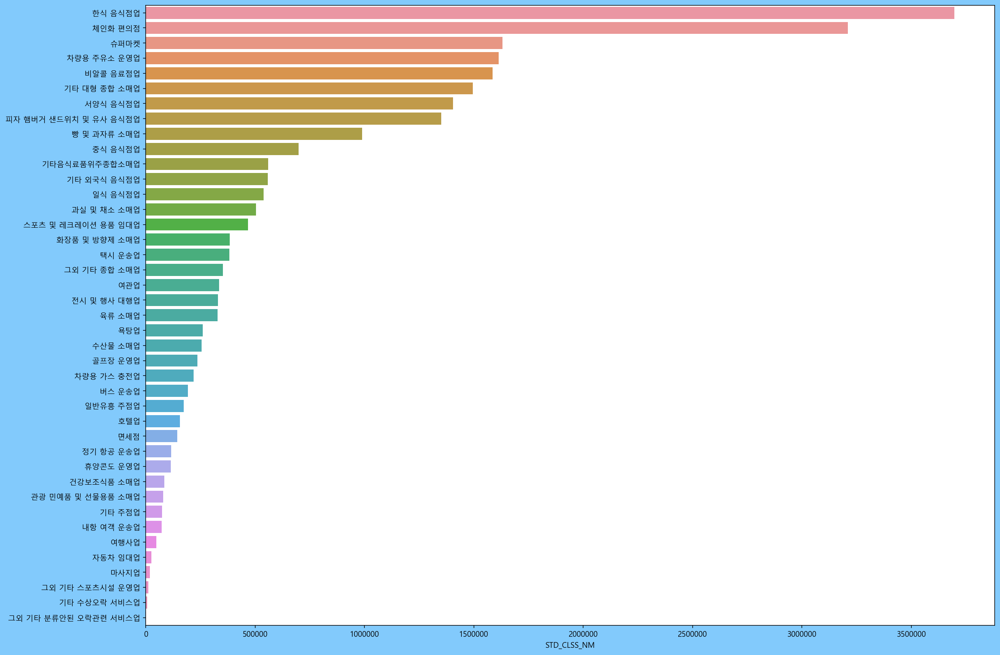

In [65]:
# 등장 횟수 EDA(지역별 업종 비중)
# 업종별 등장 빈도수
fig = plt.figure(figsize=(20, 15))
fig.patch.set_facecolor('xkcd:sky')
sns.barplot(y=data['STD_CLSS_NM'].value_counts().index,x=data['STD_CLSS_NM'].value_counts())
#plt.tight_layout()

In [50]:
city_count= data.groupby(['CARD_SIDO_NM','CARD_CCG_NM'])['STD_CLSS_NM'].value_counts().reset_index(name='count')
city_count.head()

,CARD_SIDO_NM,CARD_CCG_NM,STD_CLSS_NM,count
0,강원,강릉시,한식 음식점업,24490
1,강원,강릉시,체인화 편의점,20117
2,강원,강릉시,비알콜 음료점업,13013
3,강원,강릉시,서양식 음식점업,12398
4,강원,강릉시,기타 대형 종합 소매업,10258


In [55]:
jeju = city_count[city_count['CARD_SIDO_NM'] == '제주']

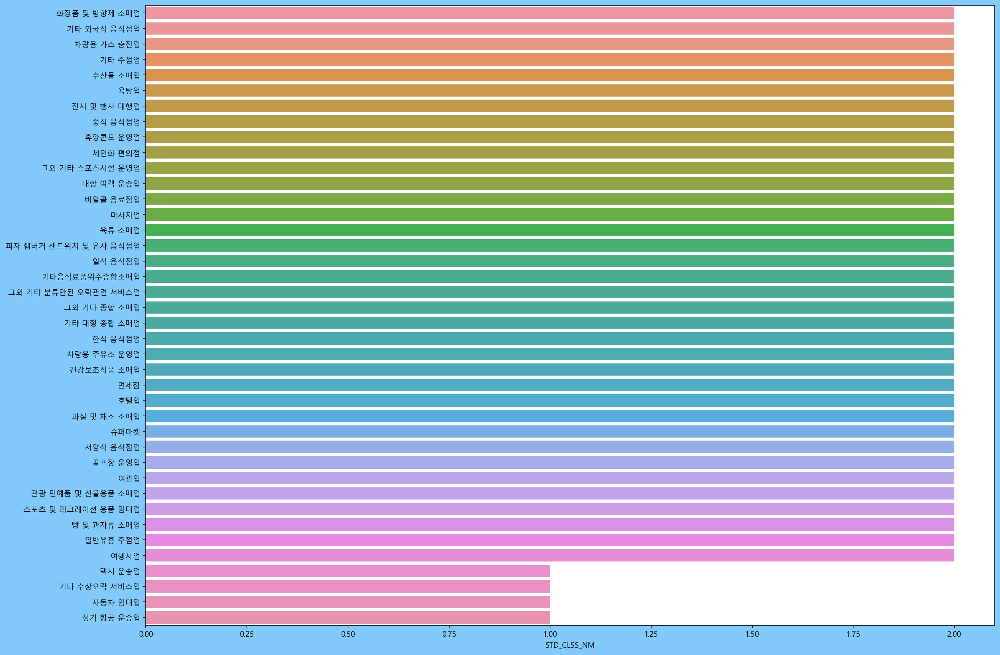

In [66]:
fig = plt.figure(figsize=(20, 15))
fig.patch.set_facecolor('xkcd:sky')
sns.barplot(y=jeju['STD_CLSS_NM'].value_counts().index,x=jeju['STD_CLSS_NM'].value_counts())

In [58]:
# 시,군,구 변수에 활용하기 어렵기 때문에 도별로 groupby , sum으로 count 
city_sum = city_count.groupby(['CARD_SIDO_NM','STD_CLSS_NM'])['count'].sum().reset_index(name='sum')
city_sum

,CARD_SIDO_NM,STD_CLSS_NM,sum
0,강원,건강보조식품 소매업,1480
1,강원,골프장 운영업,32089
2,강원,과실 및 채소 소매업,27154
3,강원,관광 민예품 및 선물용품 소매업,4428
4,강원,그외 기타 분류안된 오락관련 서비스업,2
...,...,...,...
613,충북,피자 햄버거 샌드위치 및 유사 음식점업,36079
614,충북,한식 음식점업,204802
615,충북,호텔업,1307
616,충북,화장품 및 방향제 소매업,7445


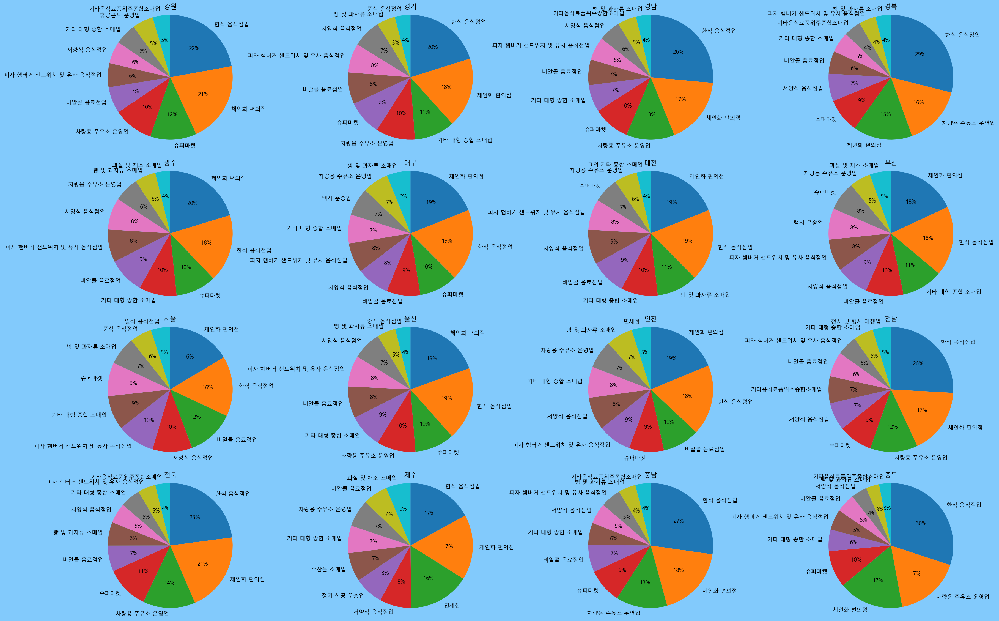

In [68]:
fig,axs = plt.subplots(4, 4)
fig.set_size_inches(30,20)
fig.patch.set_facecolor('xkcd:sky')

for idx,city in enumerate(city_sum['CARD_SIDO_NM'].unique()):
    if idx <=3:
        axs[0, idx].pie(city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['sum'],autopct='%.0f%%',
                  labels= city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['STD_CLSS_NM'],
                    radius= 1.2,
                    startangle=90,
                    counterclock=False)
        axs[0, idx].title.set_text(city)
    if idx > 3 and idx <=7:
        axs[1, idx-4].pie(city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['sum'],autopct='%.0f%%',
                  labels= city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['STD_CLSS_NM'],
                  radius= 1.2,
                  startangle=90,
                  counterclock=False)
        axs[1, idx-4].title.set_text(city)
    if idx > 7 and idx <= 11:
        axs[2, idx-8].pie(city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['sum'],autopct='%.0f%%',
                  labels= city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['STD_CLSS_NM'],
                  radius= 1.2,
                  startangle=90,
                  counterclock=False)
        axs[2, idx-8].title.set_text(city)
    if idx > 11 and idx <=15:
        axs[3, idx-12].pie(city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['sum'],autopct='%.0f%%',
                  labels= city_sum[city_sum['CARD_SIDO_NM']==city].sort_values('sum',ascending=False).head(10)['STD_CLSS_NM'],
                  radius= 1.2,
                  startangle=90,
                  counterclock=False)
        axs[3, idx-12].title.set_text(city)

#plt.tight_layout()
plt.show()

* TOP3 및 특징
    * 강원: [한식,편의점,슈퍼마켓], 휴양콘도
    * 경기: [한식, 편의점, 기타 대형 종합 소매업]
    * 경남: [한식, 편의점,주유소], 기타음식료품위주종합소매업
    * 경북: [한식, 주유소,편의점]
    * 광주: [편의점, 한식, 슈퍼마켓]
    * 대구: [편의점, 한식, 슈퍼마켓], 택시
    * 대전: [편의점,한식,빵 및 과자류 소매업]
    * 부산: [편의점, 한식, 기타 대형 종합 소매업], 택시
    * 서울: [편의점, 한식, 비알콜 음료점업], 4위: 서양식, 5위: 피자 햄버거 샌드위치
    * 울산: [편의점,한식,슈퍼마켓]
    * 인천: [편의점, 한식, 비알콜 음료점업], 5,6 위 피자 햄버거, 서양식
    * 전남: [한식, 편의점, 주유소], 기타음식료품위주종합소매업, 전시 및 행사 대행업
    * 전북: [한식, 체인화 편의점, 주유소], 기타음식료품위주종합소매업
    * 제주: [한식,편으점,면세점], 3위 면세점 주목
    * 충남: [한식,편의점,주유소], 기타음식료품위주종합소매업
    * 충북: [한식,주유소,편의점], 기타음식료품위주종합소매업

In [69]:
## 업종별 이용 건수

In [72]:
stuff = data.groupby('STD_CLSS_NM')[['CNT','CSTMR_CNT']].sum().reset_index()
stuff.head()

,STD_CLSS_NM,CNT,CSTMR_CNT
0,건강보조식품 소매업,1097627,921682
1,골프장 운영업,4951383,3649887
2,과실 및 채소 소매업,24497628,15953201
3,관광 민예품 및 선물용품 소매업,593750,482667
4,그외 기타 분류안된 오락관련 서비스업,1410,1258


In [73]:
def make_bar(data,x_col,y_col):
    fig = plt.figure(figsize=(14, 7))
    fig.patch.set_facecolor('xkcd:sky')
    sns.barplot(x=x_col,y=y_col,data=data.sort_values(x_col,ascending=False))
    plt.title(x_col)
    plt.show()

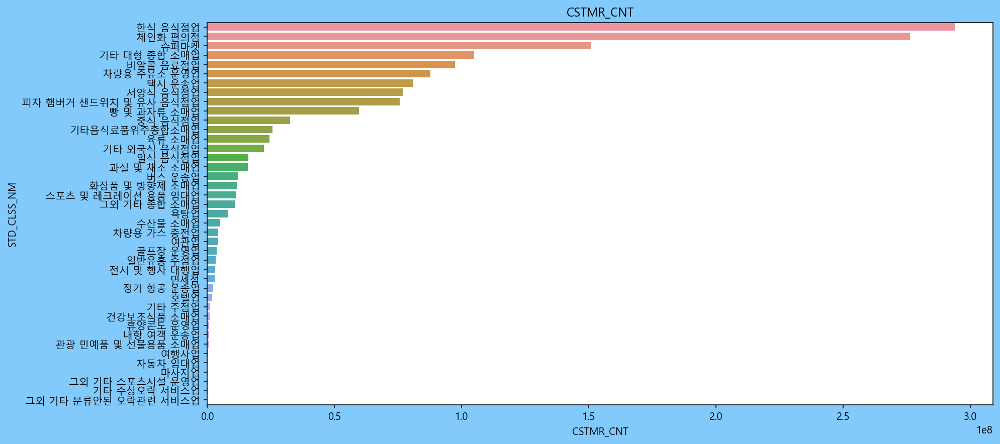

In [74]:
# 이용 고객수
make_bar(stuff,'CSTMR_CNT','STD_CLSS_NM')

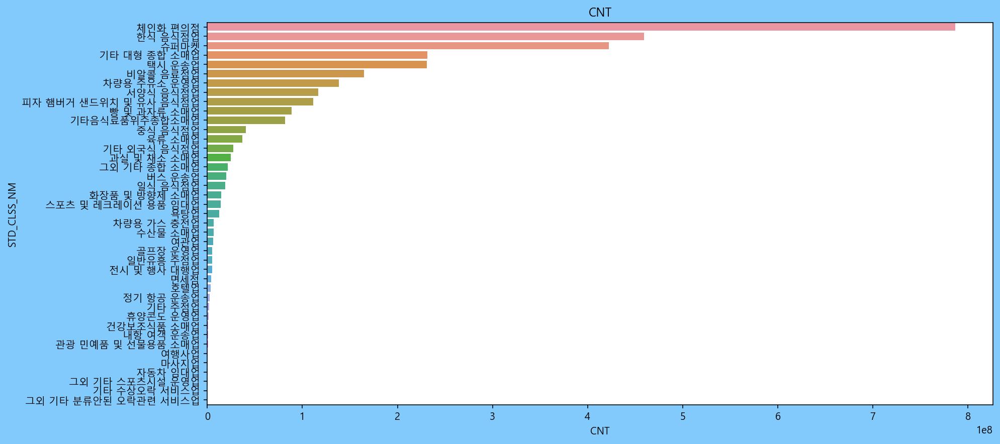

In [77]:
# 이용 횟수
make_bar(stuff,'CNT','STD_CLSS_NM')

## 이용 고객수와 이용횟수의 1,2위가 다름

In [78]:
data['gap']= data['CNT'] - data['CSTMR_CNT']

In [79]:
data[data['gap'] == -236]

,REG_YYMM,CARD_SIDO_NM,CARD_CCG_NM,STD_CLSS_NM,HOM_SIDO_NM,HOM_CCG_NM,AGE,SEX_CTGO_CD,FLC,CSTMR_CNT,AMT,CNT,gap
22840723,202002,서울,강서구,정기 항공 운송업,제주,제주시,40s,2,3,643,9643960,407,-236


In [80]:
data.loc[data['gap'] <0,'mark'] = '취소있음'
data.loc[data['gap'] ==0,'mark'] = '고객다름'
data.loc[data['gap'] >0,'mark'] = '단골있음'

In [81]:
gap=data.groupby('STD_CLSS_NM')['mark'].value_counts().reset_index(name='count')
gap.head()

,STD_CLSS_NM,mark,count
0,건강보조식품 소매업,단골있음,43803
1,건강보조식품 소매업,고객다름,37272
2,건강보조식품 소매업,취소있음,2782
3,골프장 운영업,단골있음,164503
4,골프장 운영업,고객다름,71807


In [87]:
# 카드 취소 내역이 있는 업종
df=gap.groupby('STD_CLSS_NM')['count'].sum().reset_index().merge(gap[gap['mark']=='취소있음'][['STD_CLSS_NM','count']],on='STD_CLSS_NM')
df.rename(columns={'count_x': 'total',
                   'count_y': 'cancel_count'},inplace=True)
df['rate'] = df['cancel_count']/df['total']

df=df.sort_values('rate',ascending=False).reset_index(drop=True)
df.head()

,STD_CLSS_NM,total,cancel_count,rate
0,정기 항공 운송업,115914,38014,0.327950
1,여행사업,47446,5537,0.116701
2,건강보조식품 소매업,83857,2782,0.033176
3,내항 여객 운송업,72294,1857,0.025687
4,스포츠 및 레크레이션 용품 임대업,466533,9912,0.021246


In [89]:
# 새로운 고객으로만 구성된 업종

df=gap.groupby('STD_CLSS_NM')['count'].sum().reset_index().merge(gap[gap['mark']=='고객다름'][['STD_CLSS_NM','count']],on='STD_CLSS_NM')
df.rename(columns={'count_x': 'total',
                   'count_y': 'differ_count'},inplace=True)
df['rate'] = df['differ_count']/df['total']

df=df.sort_values('rate',ascending=False).reset_index(drop=True)
df.head()

,STD_CLSS_NM,total,differ_count,rate
0,그외 기타 분류안된 오락관련 서비스업,288,202,0.701389
1,자동차 임대업,26024,15043,0.578043
2,여행사업,47446,24418,0.514648
3,관광 민예품 및 선물용품 소매업,78793,40065,0.508484
4,일식 음식점업,539071,247091,0.458364


In [91]:
# 단골 고객이 있는 업종

df=gap.groupby('STD_CLSS_NM')['count'].sum().reset_index().merge(gap[gap['mark']=='단골있음'][['STD_CLSS_NM','count']],on='STD_CLSS_NM')
df.rename(columns={'count_x': 'total',
                   'count_y': 'differ_count'},inplace=True)
df['rate'] = df['differ_count']/df['total']

df=df.sort_values('rate',ascending=False).reset_index(drop=True)
df.head(20)

,STD_CLSS_NM,total,differ_count,rate
0,버스 운송업,192281,171896,0.893983
1,체인화 편의점,3210466,2867733,0.893245
2,슈퍼마켓,1630700,1445836,0.886635
3,기타 대형 종합 소매업,1495163,1317200,0.880974
4,면세점,144349,122761,0.850446
5,기타음식료품위주종합소매업,558716,469163,0.839716
6,한식 음식점업,3697166,3025850,0.818424
7,휴양콘도 운영업,114921,93739,0.815682
8,그외 기타 종합 소매업,351817,283172,0.804884
9,욕탕업,259567,205909,0.793279


In [92]:
data.drop(['gap','mark'],axis=1,inplace=True) # 데이터 원상복구

In [95]:
df = data.groupby('CARD_SIDO_NM')[['CSTMR_CNT','CNT']].sum().reset_index()
df.head()

,CARD_SIDO_NM,CSTMR_CNT,CNT
0,강원,35424111,64382529
1,경기,345133871,701143788
2,경남,78397280,149370331
3,경북,59718037,113078004
4,광주,43127377,82758813


In [108]:
# 지역에 따른 업종별 이용건수
df = data.groupby(['CARD_SIDO_NM','STD_CLSS_NM'])[['CSTMR_CNT','CNT']].sum().reset_index()
df.head()

,CARD_SIDO_NM,STD_CLSS_NM,CSTMR_CNT,CNT
0,강원,건강보조식품 소매업,15343,16170
1,강원,골프장 운영업,326003,465266
2,강원,과실 및 채소 소매업,318132,428427
3,강원,관광 민예품 및 선물용품 소매업,18764,22012
4,강원,그외 기타 분류안된 오락관련 서비스업,6,10


In [109]:
df[df['CSTMR_CNT']>df['CNT']]

,CARD_SIDO_NM,STD_CLSS_NM,CSTMR_CNT,CNT
178,광주,여행사업,46,42
215,대구,여행사업,99,87
250,대전,여행사업,3,2
560,제주,정기 항공 운송업,291007,290548


In [110]:
# 재방문율 변수 만들기

df['re_visit']=1 - df['CSTMR_CNT']/df['CNT']

In [111]:
df[df['CARD_SIDO_NM'] == '제주'].sort_values('re_visit',ascending=False).head()


,CARD_SIDO_NM,STD_CLSS_NM,CSTMR_CNT,CNT,re_visit
550,제주,슈퍼마켓,2346273,6394700,0.633091
564,제주,체인화 편의점,5122900,12964210,0.604843
542,제주,기타음식료품위주종합소매업,580721,1283628,0.547594
537,제주,그외 기타 종합 소매업,271341,596267,0.544934
538,제주,기타 대형 종합 소매업,831351,1644164,0.494362


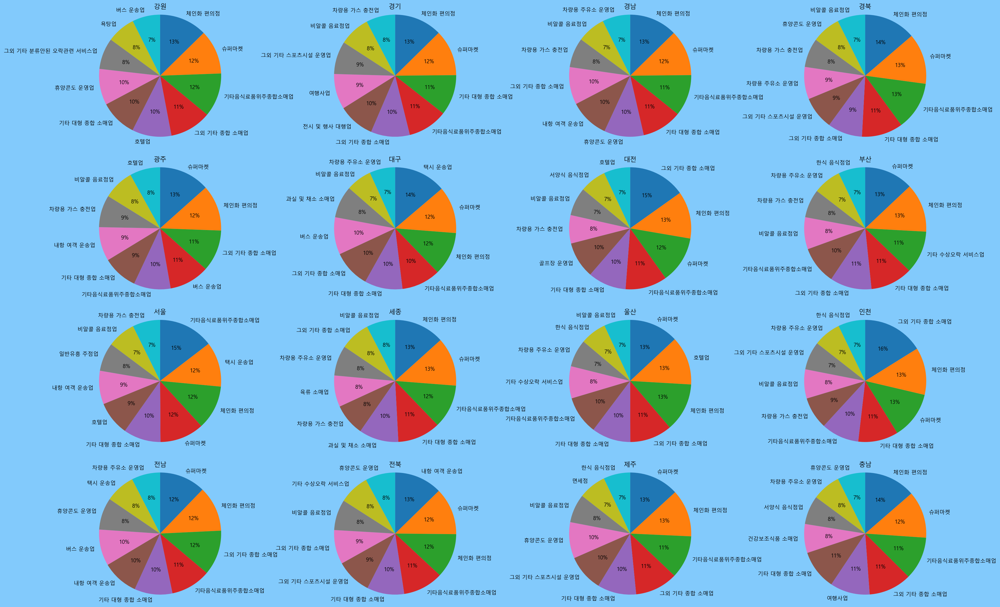

In [112]:
fig,axs = plt.subplots(4, 4)
fig.set_size_inches(30,20)
fig.patch.set_facecolor('xkcd:sky')

for idx,city in enumerate(df['CARD_SIDO_NM'].unique()):
  if idx <=3:
    axs[0, idx].pie(df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['re_visit'],autopct='%.0f%%',
                  labels= df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['STD_CLSS_NM'],
                  radius= 1.2,
                  startangle=90,
                  counterclock=False)
    axs[0, idx].title.set_text(city)
  if idx > 3 and idx <=7:
    axs[1, idx-4].pie(df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['re_visit'],autopct='%.0f%%',
                  labels= df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['STD_CLSS_NM'],
                  radius= 1.2,
                  startangle=90,
                  counterclock=False)
    axs[1, idx-4].title.set_text(city)
  if idx > 7 and idx <= 11:
    axs[2, idx-8].pie(df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['re_visit'],autopct='%.0f%%',
                  labels= df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['STD_CLSS_NM'],
                  radius= 1.2,
                  startangle=90,
                  counterclock=False)
    axs[2, idx-8].title.set_text(city)
  if idx > 11 and idx <=15:
    axs[3, idx-12].pie(df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['re_visit'],autopct='%.0f%%',
                  labels= df[df['CARD_SIDO_NM']==city].sort_values('re_visit',ascending=False).head(10)['STD_CLSS_NM'],
                  radius= 1.2,
                  startangle=90,
                  counterclock=False)
    axs[3, idx-12].title.set_text(city)

#plt.tight_layout()
plt.show()

In [113]:
df = data.groupby('REG_YYMM')[['CSTMR_CNT','CNT']].sum().reset_index()
#df['REG_YYMM']=df['REG_YYMM'].astype('object')
df.head()

,REG_YYMM,CSTMR_CNT,CNT
0,201901,98934121,197458766
1,201902,93167173,175758111
2,201903,103677023,209598246
3,201904,103458114,211060076
4,201905,111522559,228416675


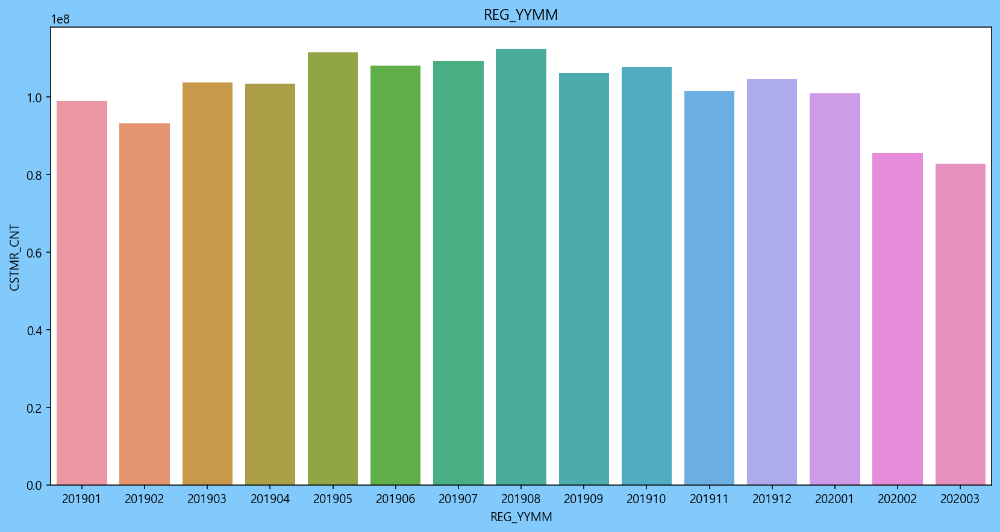

In [114]:
make_bar(df,'REG_YYMM','CSTMR_CNT')

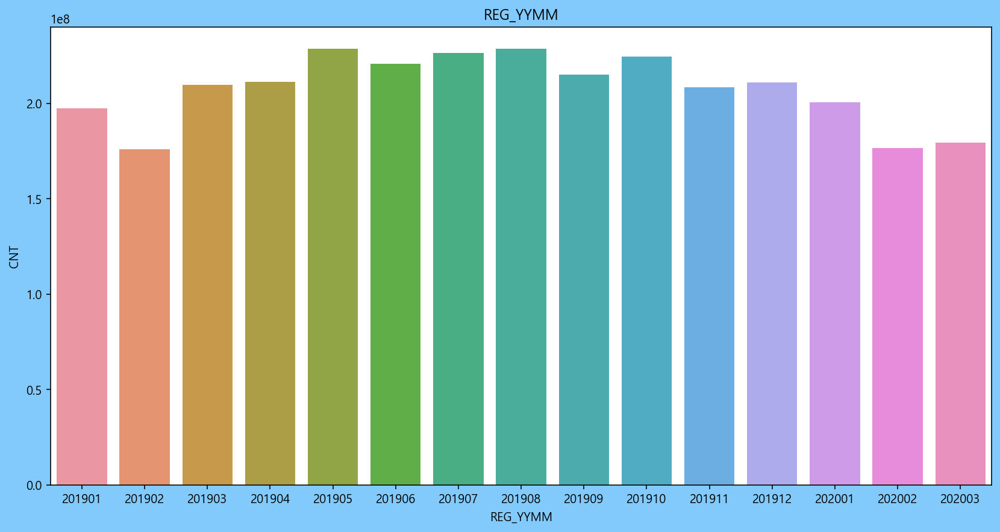

In [115]:
make_bar(df,'REG_YYMM','CNT')

In [116]:
df = data.groupby(['REG_YYMM','STD_CLSS_NM'])[['CSTMR_CNT','CNT']].sum().reset_index()
df.head()

,REG_YYMM,STD_CLSS_NM,CSTMR_CNT,CNT
0,201901,건강보조식품 소매업,65982,80305
1,201901,골프장 운영업,101473,152181
2,201901,과실 및 채소 소매업,1051062,1597593
3,201901,관광 민예품 및 선물용품 소매업,30059,36811
4,201901,그외 기타 분류안된 오락관련 서비스업,19,27


In [117]:
# 날짜 변경 -> 일반 숫자로
for idx,date in enumerate(df['REG_YYMM'].unique()):
  df.loc[df['REG_YYMM']==date,'new_date'] = idx

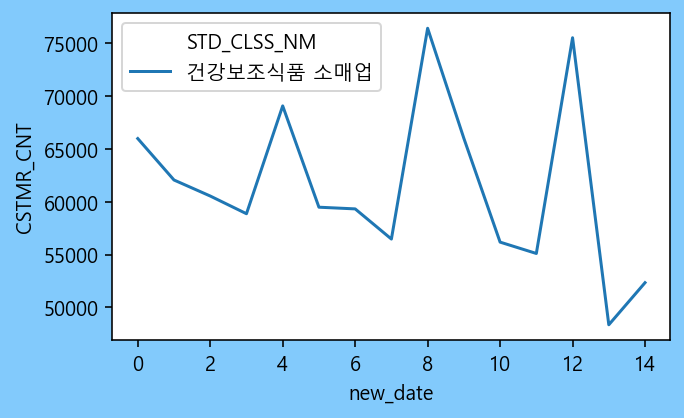

In [126]:
fig = plt.figure(figsize=(5, 3))
fig.patch.set_facecolor('xkcd:sky')
sns.lineplot(x='new_date',y='CSTMR_CNT',data=df[df['STD_CLSS_NM']=='건강보조식품 소매업'],hue='STD_CLSS_NM')
plt.show()

In [127]:
def make_line(data,x_col,y_1,y_2,hue_col):
  fig,(ax1,ax2) = plt.subplots(ncols=2)
  #print(axs)
  fig.set_size_inches(10,5)
  fig.patch.set_facecolor('xkcd:sky')
  sns.lineplot(x=x_col,y=y_1,data=df[df['STD_CLSS_NM']== hue_col],hue='STD_CLSS_NM',ax=ax1)
  fig.patch.set_facecolor('xkcd:mint green')
  sns.lineplot(x=x_col,y=y_2,data=df[df['STD_CLSS_NM']== hue_col],hue='STD_CLSS_NM',ax=ax2)
  plt.show()

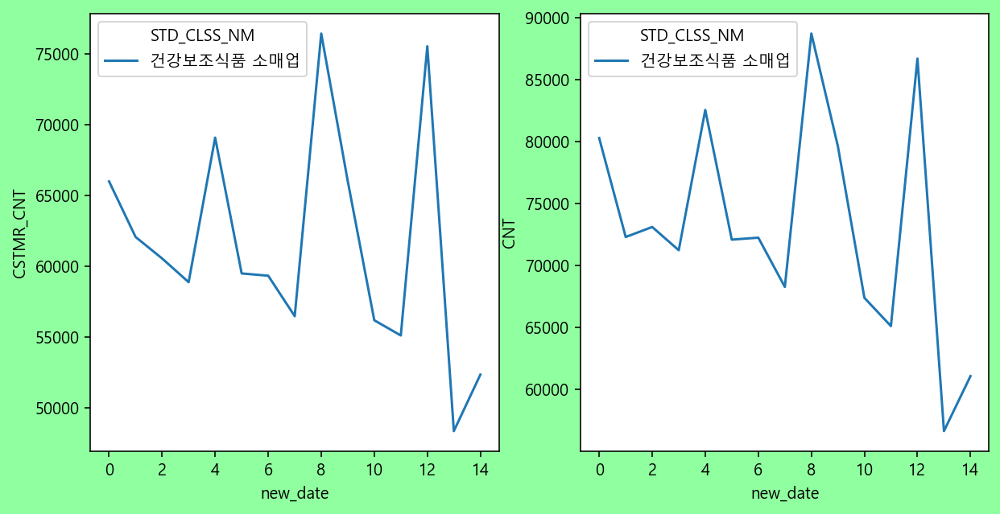

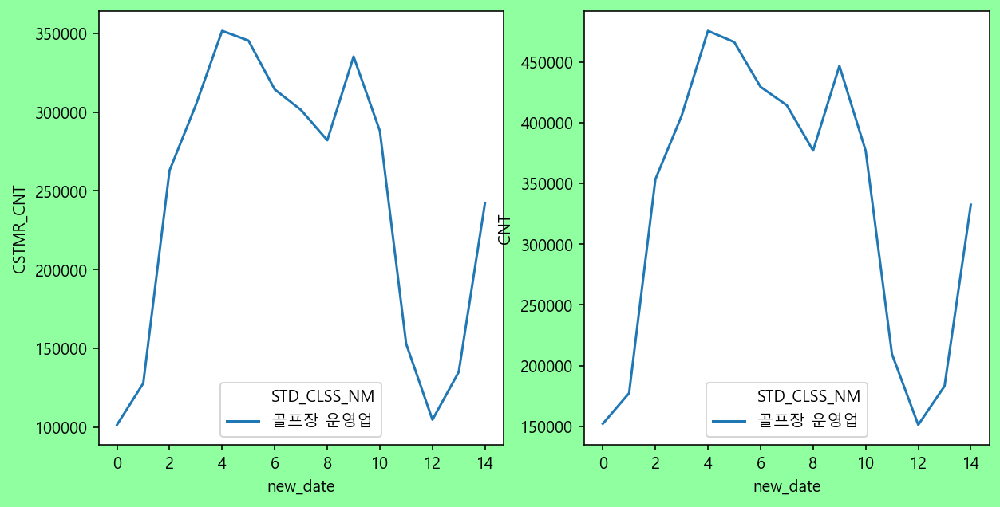

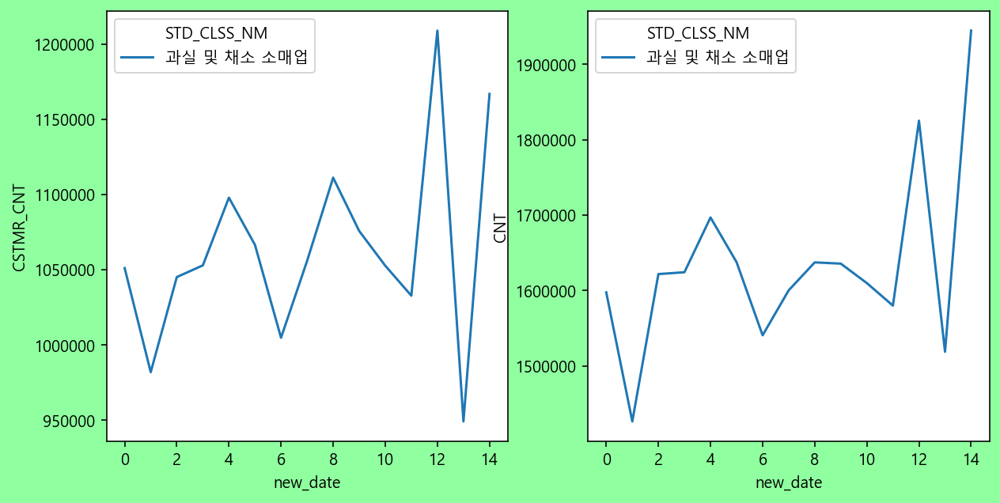

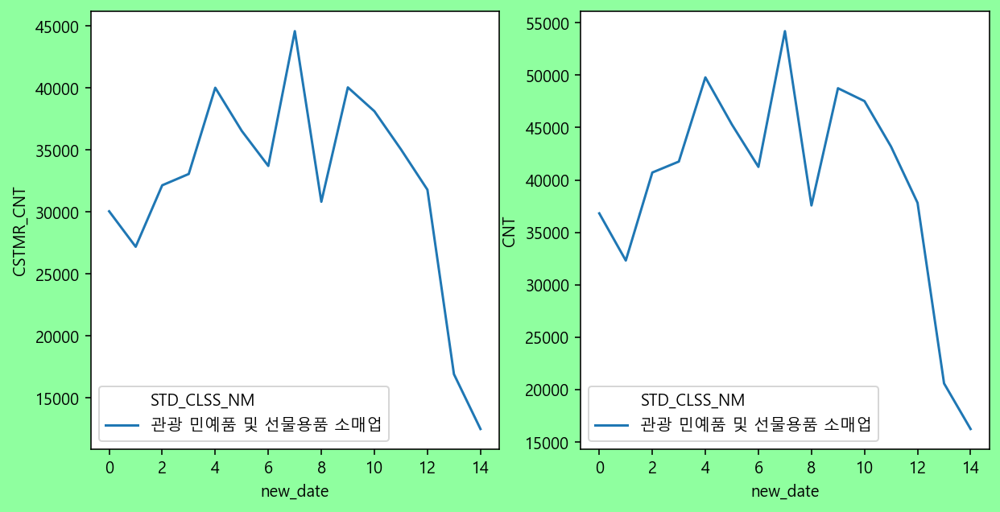

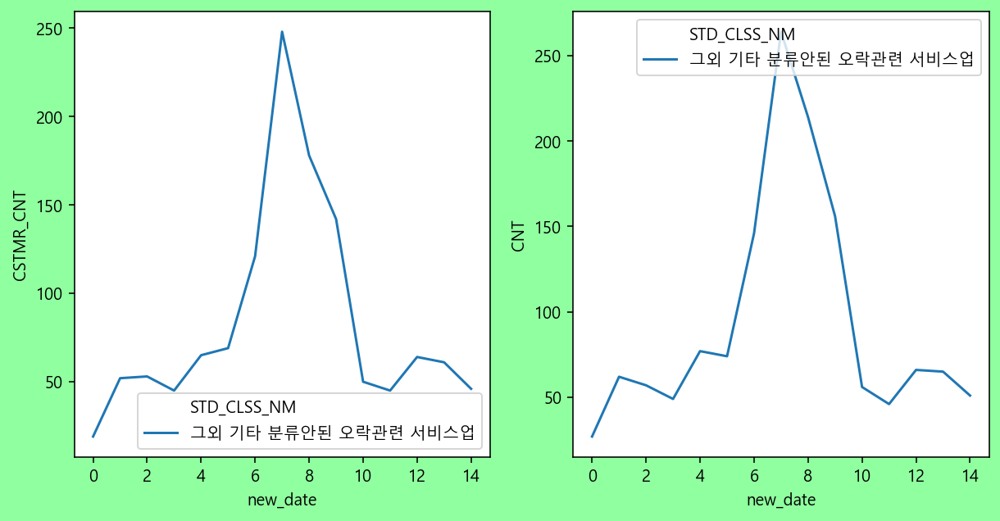

...

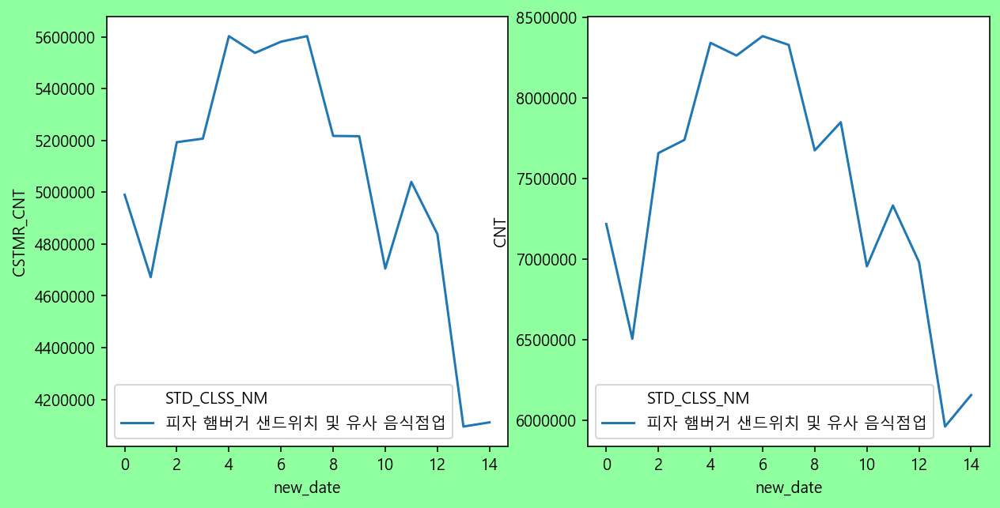

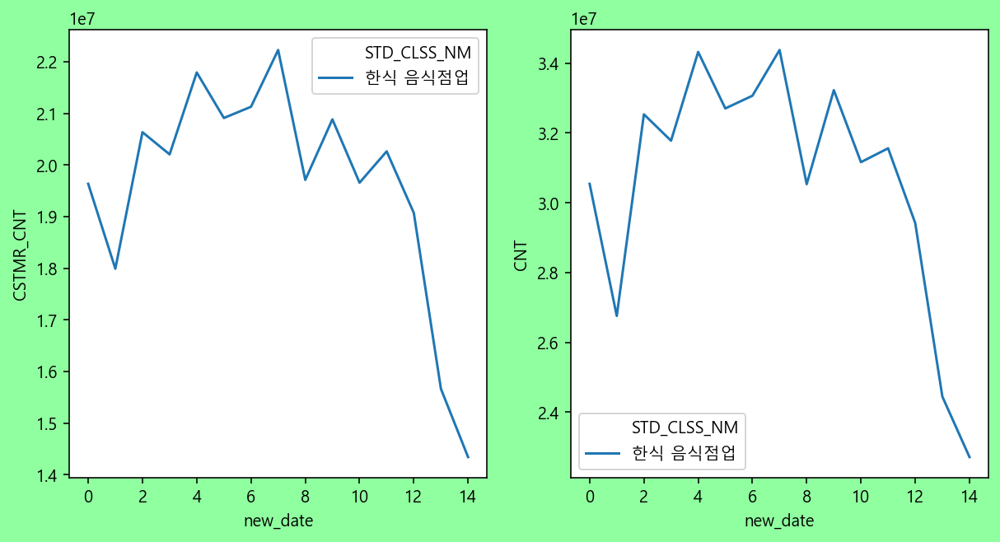

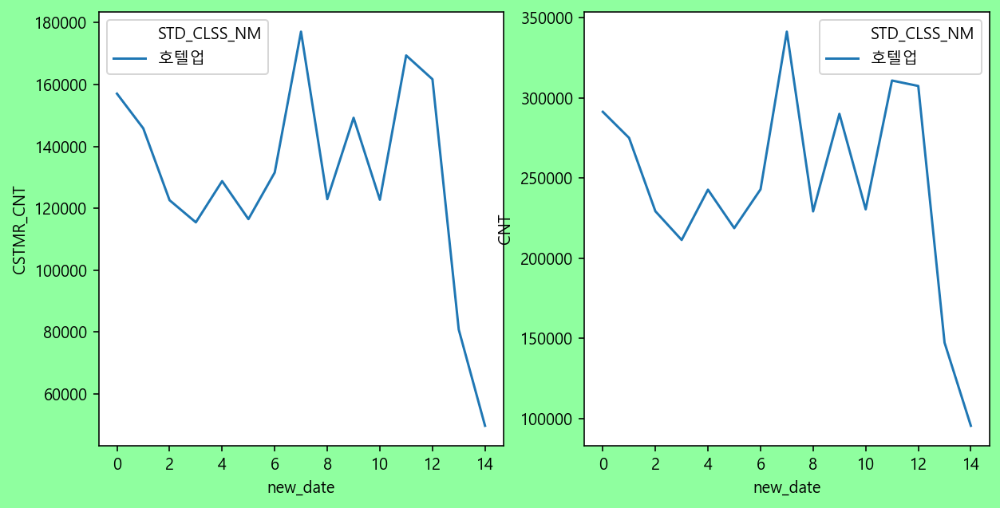

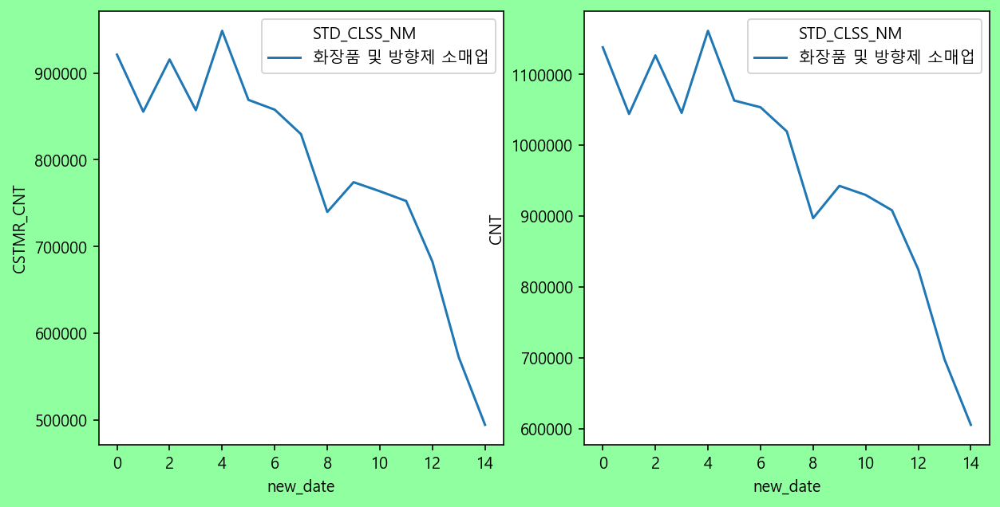

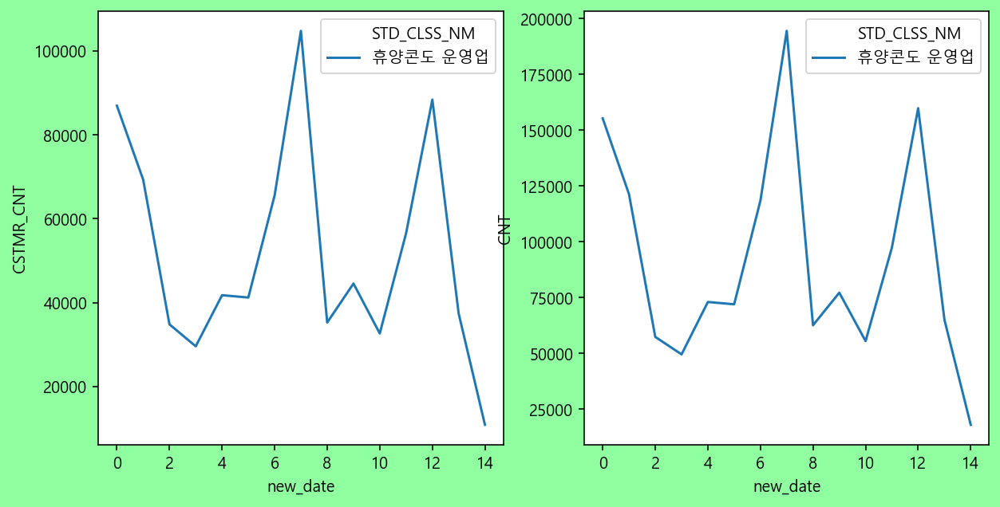

In [128]:
for hue_col in df['STD_CLSS_NM'].unique():
  make_line(df,'new_date','CSTMR_CNT','CNT',hue_col)

In [129]:
df = data.groupby(['REG_YYMM','STD_CLSS_NM'])[['CSTMR_CNT','CNT','AMT']].sum().reset_index()
df.head()

,REG_YYMM,STD_CLSS_NM,CSTMR_CNT,CNT,AMT
0,201901,건강보조식품 소매업,65982,80305,8605074944
1,201901,골프장 운영업,101473,152181,11968748603
2,201901,과실 및 채소 소매업,1051062,1597593,44453112689
3,201901,관광 민예품 및 선물용품 소매업,30059,36811,955750428
4,201901,그외 기타 분류안된 오락관련 서비스업,19,27,1017500


In [130]:
# 날짜 변경 -> 일반 숫자로
for idx,date in enumerate(df['REG_YYMM'].unique()):
  df.loc[df['REG_YYMM']==date,'new_date'] = idx

In [131]:
df[['CSTMR_CNT','CNT','AMT']]

,CSTMR_CNT,CNT,AMT
0,65982,80305,8605074944
1,101473,152181,11968748603
2,1051062,1597593,44453112689
3,30059,36811,955750428
4,19,27,1017500
...,...,...,...
610,4111592,6154824,65972238656
611,14340333,22708444,666573459086
612,49737,95337,5073633041
613,494131,605546,31002789304


In [132]:
def make_line(data,x_col,y_1,y_2,y_3,hue_col):
  fig,(ax1,ax2,ax3) = plt.subplots(ncols=3)
  fig.patch.set_facecolor('xkcd:sky')
  fig.set_size_inches(10,5)
  
  sns.lineplot(x=x_col,y=y_1,data=df[df['STD_CLSS_NM']== hue_col],hue='STD_CLSS_NM',ax=ax1)
  sns.lineplot(x=x_col,y=y_2,data=df[df['STD_CLSS_NM']== hue_col],hue='STD_CLSS_NM',ax=ax2)
  sns.lineplot(x=x_col,y=y_3,data=df[df['STD_CLSS_NM']== hue_col],hue='STD_CLSS_NM',ax=ax3)
  plt.show()

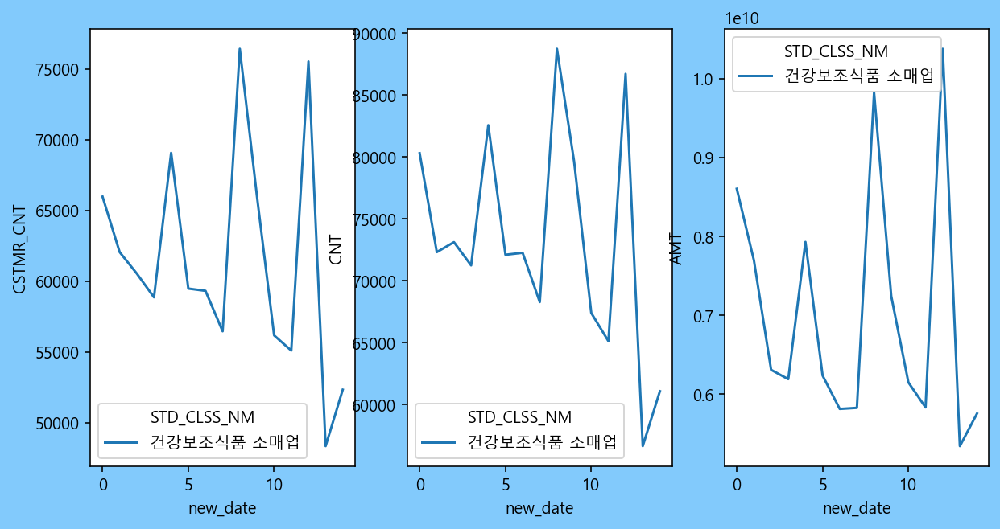

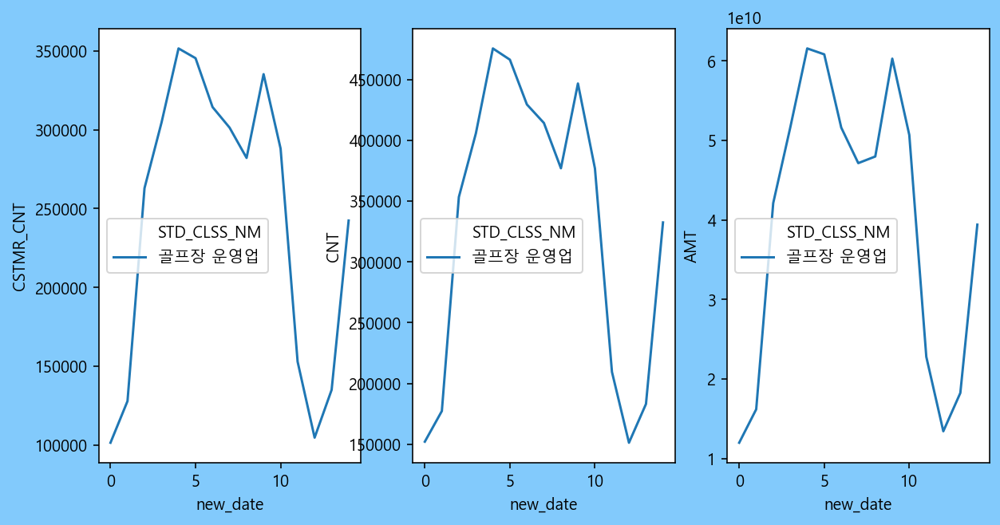

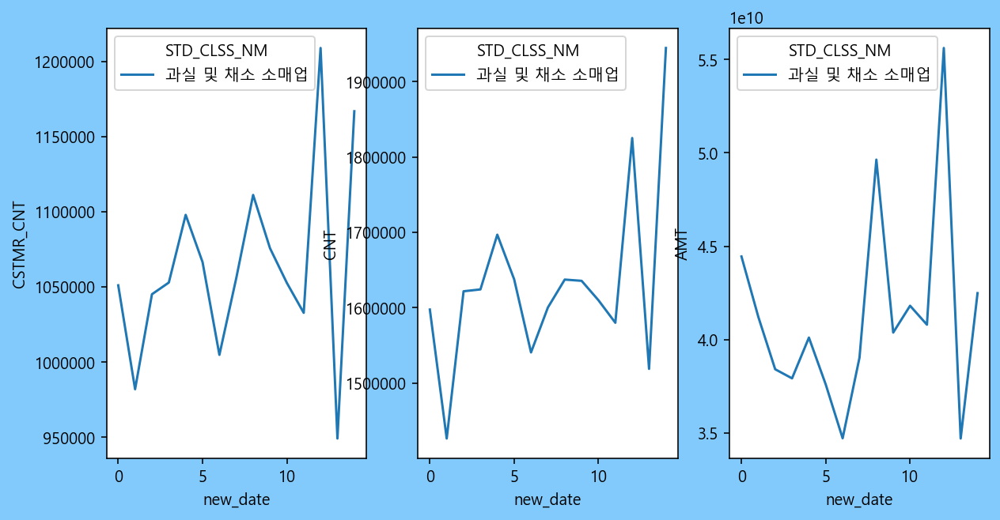

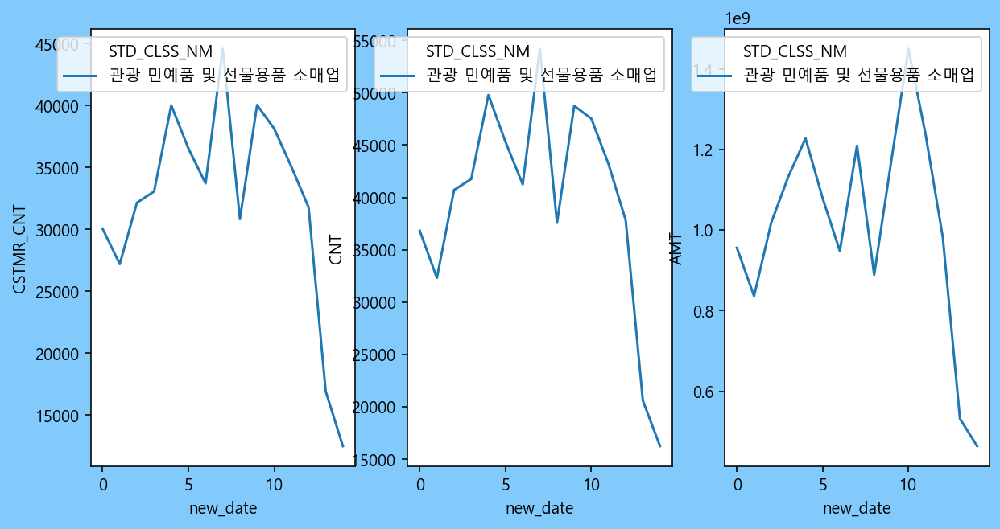

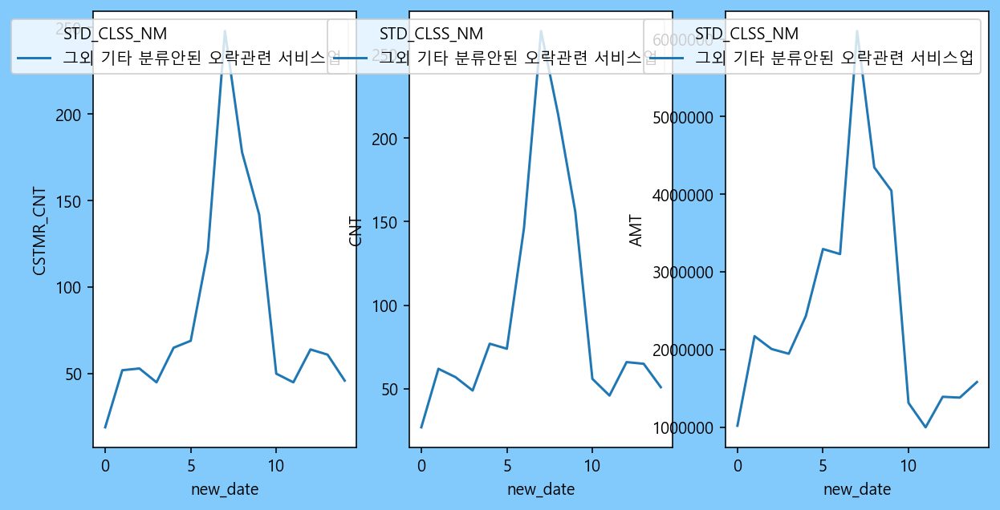

...

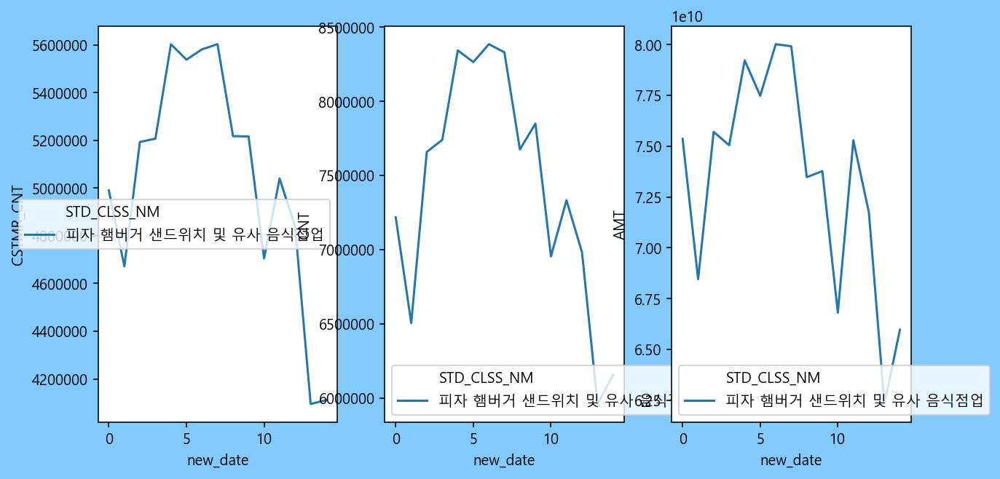

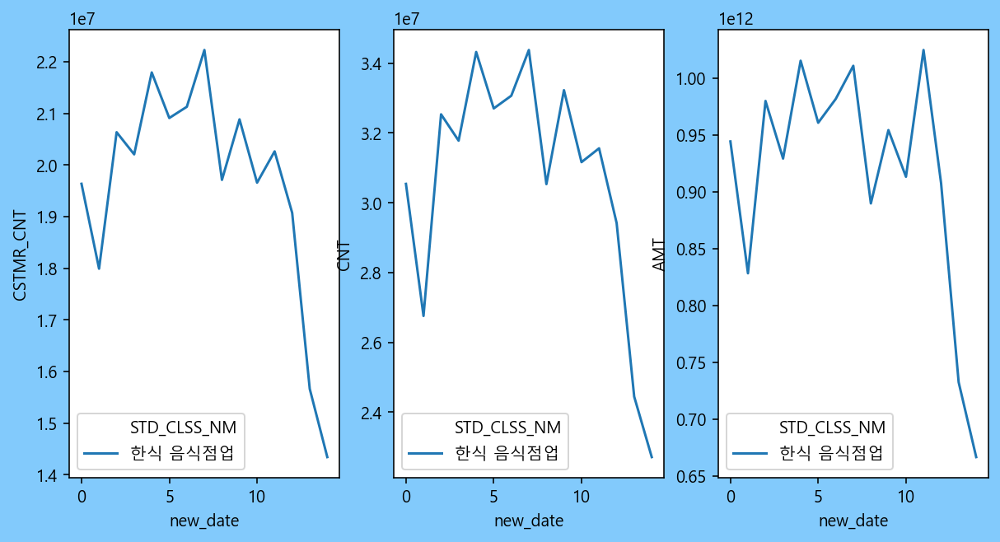

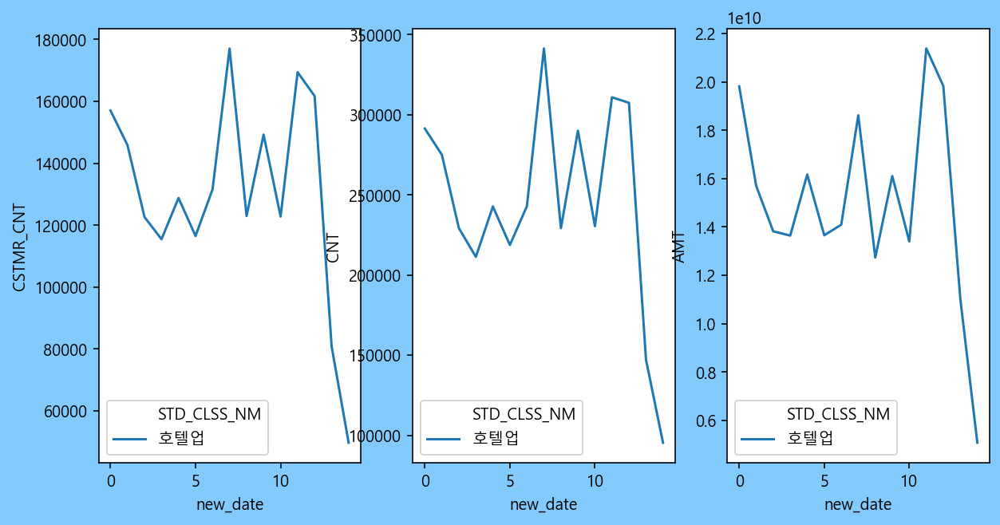

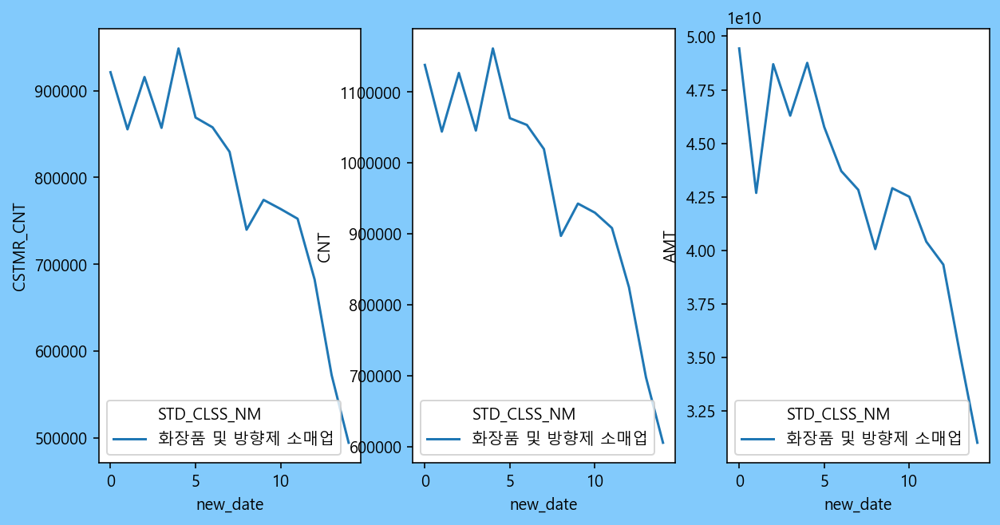

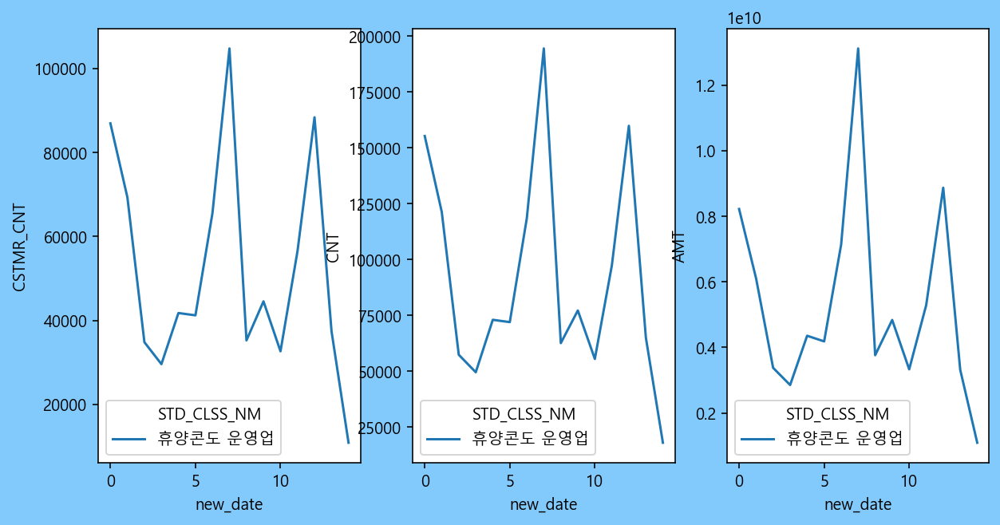

In [133]:
for hue_col in df['STD_CLSS_NM'].unique():
    make_line(df,'new_date','CSTMR_CNT','CNT','AMT',hue_col)